In [4]:
#Packages Import
import pandas as pd
from datetime import datetime
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
#https://www.kaggle.com/datasets/nicholasjhana/energy-consumption-generation-prices-and-weather?resource=download

In [5]:
#Data Load
df_energy = pd.read_csv(
    './data/energy_dataset.csv'
)

In [6]:
df_energy['time'] = pd.to_datetime(df_energy['time'], utc=True, infer_datetime_format=True)
df_energy = df_energy.set_index('time')

In [7]:
df_energy.describe()

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
count,35045.000000,35046.000000,35046.0,35046.000000,35046.000000,35045.000000,35046.0,35046.0,35046.0,0.0,...,35045.000000,35046.0,35046.000000,35064.000000,0.0,35064.000000,35064.000000,35028.000000,35064.000000,35064.000000
mean,383.513540,448.059208,0.0,5622.737488,4256.065742,298.319789,0.0,0.0,0.0,NaN,...,269.452133,0.0,5464.479769,1439.066735,NaN,5471.216689,28712.129962,28696.939905,49.874341,57.884023
std,85.353943,354.568590,0.0,2201.830478,1961.601013,52.520673,0.0,0.0,0.0,NaN,...,50.195536,0.0,3213.691587,1677.703355,NaN,3176.312853,4594.100854,4574.987950,14.618900,14.204083
min,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,NaN,...,0.000000,0.0,0.000000,0.000000,NaN,237.000000,18105.000000,18041.000000,2.060000,9.330000
25%,333.000000,0.000000,0.0,4126.000000,2527.000000,263.000000,0.0,0.0,0.0,NaN,...,240.000000,0.0,2933.000000,69.000000,NaN,2979.000000,24793.750000,24807.750000,41.490000,49.347500
50%,367.000000,509.000000,0.0,4969.000000,4474.000000,300.000000,0.0,0.0,0.0,NaN,...,279.000000,0.0,4849.000000,576.000000,NaN,4855.000000,28906.000000,28901.000000,50.520000,58.020000
75%,433.000000,757.000000,0.0,6429.000000,5838.750000,330.000000,0.0,0.0,0.0,NaN,...,310.000000,0.0,7398.000000,2636.000000,NaN,7353.000000,32263.250000,32192.000000,60.530000,68.010000
max,592.000000,999.000000,0.0,20034.000000,8359.000000,449.000000,0.0,0.0,0.0,NaN,...,357.000000,0.0,17436.000000,5836.000000,NaN,17430.000000,41390.000000,41015.000000,101.990000,116.800000


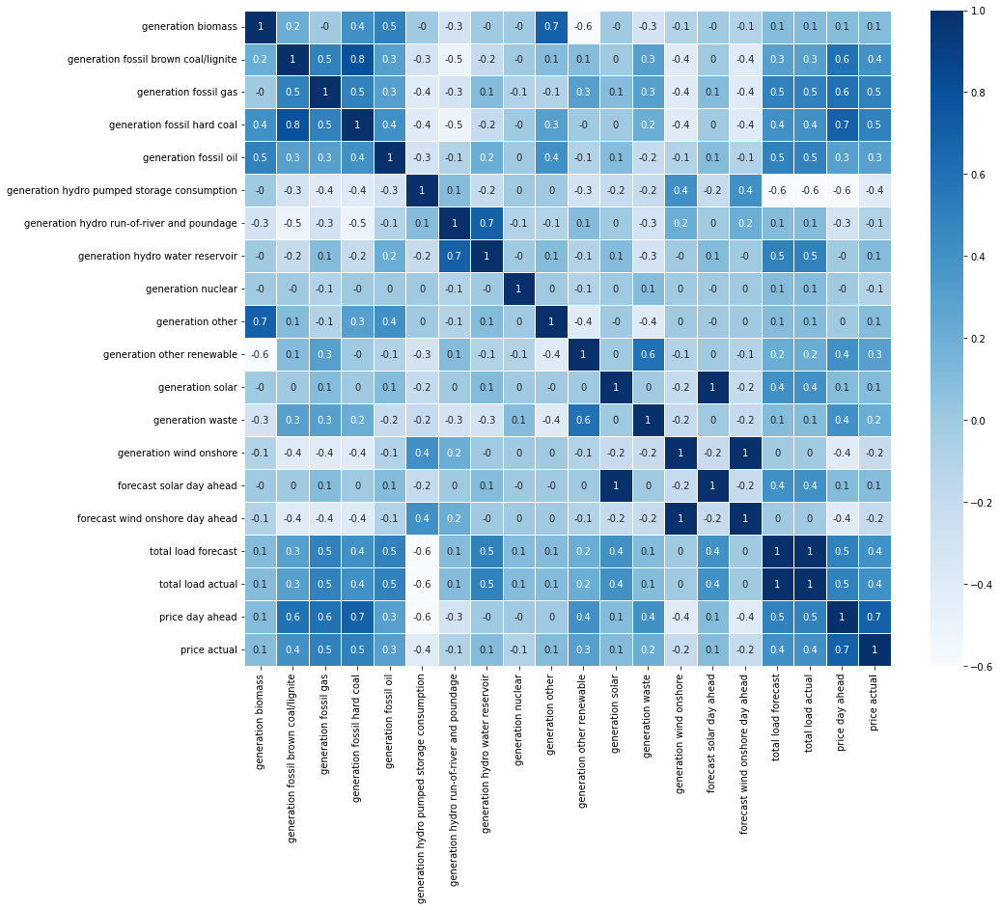

In [8]:
#HeatMap Plot of correlation values with dropped the below columns.
plt.figure(figsize=(15,12.5))
sns.heatmap(round(df_energy.drop(['generation marine',
                 'generation geothermal',
                 'generation fossil peat',
                 'generation wind offshore',
                 'generation fossil oil shale',
                 'forecast wind offshore eday ahead',
                 'generation fossil coal-derived gas',
                 'generation hydro pumped storage aggregated'], axis=1).corr(),1),annot=True,cmap='Blues',linewidth=0.9)
plt.show();

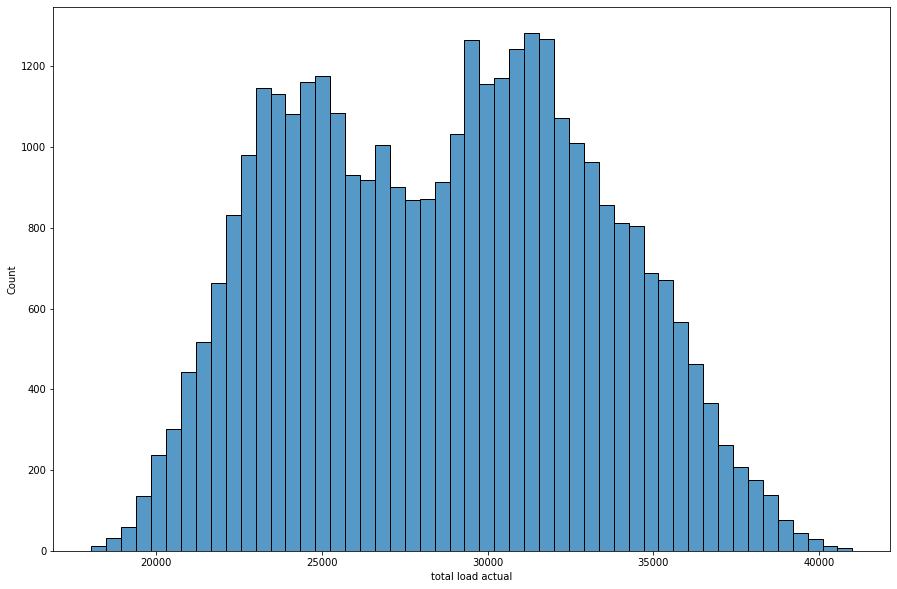

In [9]:
plt.figure(figsize=(15,10))
sns.histplot(df_energy,x='total load actual');

In [10]:
from utils.helpers import energy_clean
from utils.helpers import weather_clean
df_energy = energy_clean("./data/energy_dataset.csv")
df_weather = weather_clean("./data/weather_features.csv")

In [11]:
df = df_energy.join(df_weather,on='time', how='left',rsuffix="_r")

In [12]:
df.describe()
df.to_csv("./data/joined.csv")

In [13]:

fig = px.scatter(df_energy,x='total load actual',y='total load forecast',facet_col='month')
fig.show()

In [14]:

fig = px.scatter(df,x='total load actual',y='price actual',facet_col='month',animation_group=df.index.year)
fig.show()

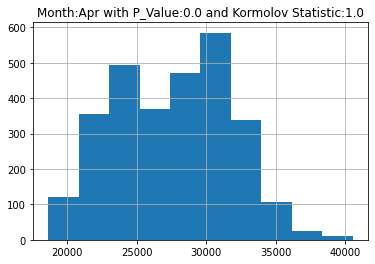

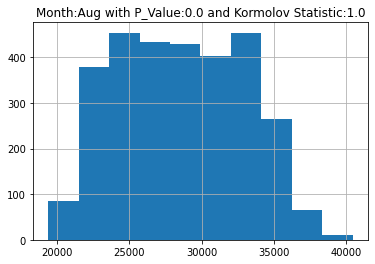

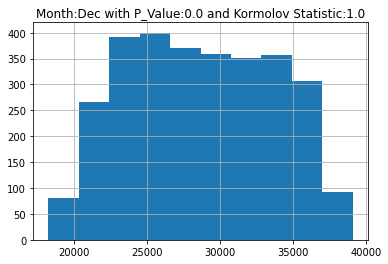

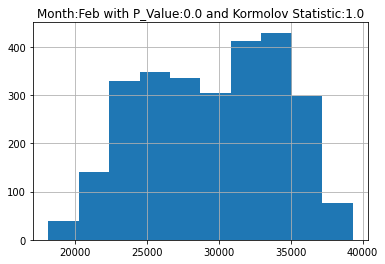

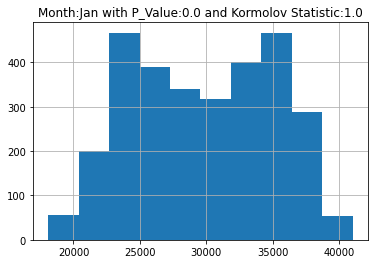

...

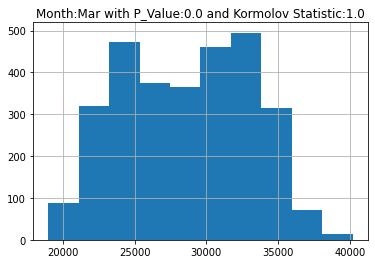

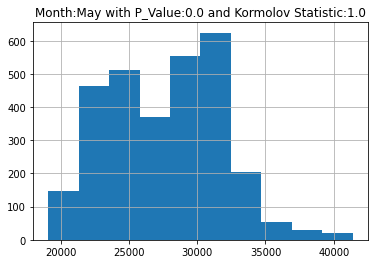

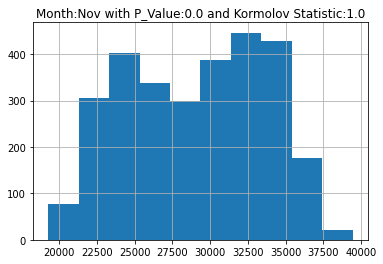

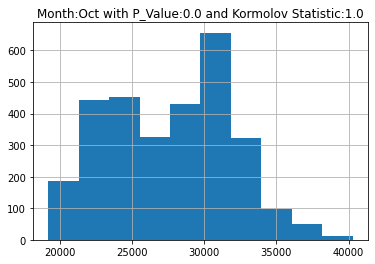

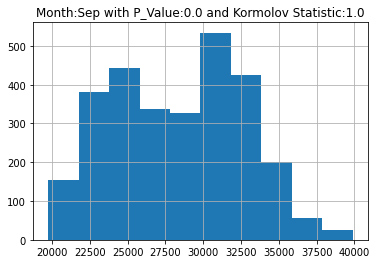

In [33]:
from scipy.stats import kstest, norm
months =np.unique(df_energy["month"])
for i in months:
    plt.figure()
    data=df_energy['total load forecast'].loc[df_energy["month"]==i]
    data.hist()
    ks,p_value= kstest(df_energy['total load forecast'].loc[df_energy["month"]==i],'norm')
    plt.title(f'Month:{i} with P_Value:{p_value} and Kormolov Statistic:{ks}')
    plt.show()

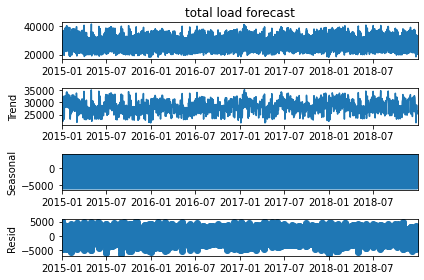

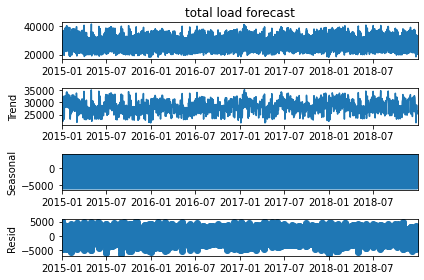

In [47]:
from statsmodels.tsa.seasonal import seasonal_decompose
df_energy.sort_index(inplace=True)
decompose_result_mult = seasonal_decompose(df_energy['total load forecast'], model="additive")
decompose_result_mult.plot()


In [62]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(df_energy["total load actual"].values.reshape(1,-1))

# split into train and test sets
train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
print(len(train), len(test))


# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return np.array(dataX), np.array(dataY)


# reshape into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

0 1


c:\Users\nikol\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\preprocessing\_data.py:461: RuntimeWarning:

All-NaN slice encountered

c:\Users\nikol\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\preprocessing\_data.py:462: RuntimeWarning:

All-NaN slice encountered



IndexError: tuple index out of range